# **Trabajo Práctico Final - Identificación de Razas de Perros en Imágenes**
---
## ***Computer Vision - TUIA***

| Autora | Legajo |
| --- | --- |
Rizzotto, María Camila | R-4676/1

# Introducción
En el presente proyecto se desarrollará un pipeline completo de visión por computadora para la identificación de razas de perros en imágenes. Se va a dividir en etapas, abarcando desde la creación de un sistema de búsqueda por similitud hasta la implementación de un sistema de detección y clasificación en imágenes complejas, incluyendo el entrenamiento y la optimización de modelos de Deep Learning.


#Etapa 1: Buscador de Imágenes por Similitud

##Carga Dataset de Kaggle

In [1]:
!pip install opendatasets

In [2]:
import opendatasets as od
od.download("https://www.kaggle.com/datasets/gpiosenka/70-dog-breedsimage-data-set") #b31129e0ec85d03fff2d47668e5b3fb4

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: camilarizzotto
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/gpiosenka/70-dog-breedsimage-data-set


100%|██████████| 215M/215M [00:00<00:00, 315MB/s]


Lo inspecciono un poco...

In [19]:
import pandas as pd

dogs = pd.read_csv('/content/70-dog-breedsimage-data-set/dogs.csv')

In [7]:
dogs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9346 entries, 0 to 9345
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   filepaths  9346 non-null   object
 1   labels     9346 non-null   object
 2   data set   9346 non-null   object
dtypes: object(3)
memory usage: 219.2+ KB


In [4]:
#Veo las diferentes razas que contempla
dogs['labels'].unique(), dogs['labels'].nunique()

(array(['Afghan', 'African Wild Dog', 'Airedale', 'American Hairless',
        'American Spaniel', 'Basenji', 'Basset', 'Beagle',
        'Bearded Collie', 'Bermaise', 'Bichon Frise', 'Blenheim',
        'Bloodhound', 'Bluetick', 'Border Collie', 'Borzoi',
        'Boston Terrier', 'Boxer', 'Bull Mastiff', 'Bull Terrier',
        'Bulldog', 'Cairn', 'Chihuahua', 'Chinese Crested', 'Chow',
        'Clumber', 'Cockapoo', 'Cocker', 'Collie', 'Corgi', 'Coyote',
        'Dalmation', 'Dhole', 'Dingo', 'Doberman', 'Elk Hound',
        'French Bulldog', 'German Sheperd', 'Golden Retriever',
        'Great Dane', 'Great Perenees', 'Greyhound', 'Groenendael',
        'Irish Spaniel', 'Irish Wolfhound', 'Japanese Spaniel', 'Komondor',
        'Labradoodle', 'Labrador', 'Lhasa', 'Malinois', 'Maltese',
        'Mex Hairless', 'Newfoundland', 'Pekinese', 'Pit Bull',
        'Pomeranian', 'Poodle', 'Pug', 'Rhodesian', 'Rottweiler',
        'Saint Bernard', 'Schnauzer', 'Scotch Terrier', 'Shar_Pei',
 

Tienen que ser 70 etiquetas, no 71. Debe haber un error

In [22]:
dogs_train = dogs[dogs['data set'] == 'train']
dogs_test = dogs[dogs['data set'] == 'test']
dogs_valid = dogs[dogs['data set'] == 'valid']
dogs_train['labels'].nunique(), dogs_test['labels'].nunique(), dogs_valid['labels'].nunique()

(70, 70, 70)

In [6]:
#Todos tienen 70 pero en el dataset hay una de más. Buscamos diferencias
def diff_sets(list1, list2):
    set1 = set(list1)
    set2 = set(list2)
    return list(set1.difference(set2))

dogs_train_labels = dogs_train['labels'].unique()
dogs_test_labels = dogs_test['labels'].unique()
dogs_valid_labels = dogs_valid['labels'].unique()

diff_sets(dogs_train_labels, dogs_test_labels), diff_sets(dogs_valid_labels, dogs_train_labels), diff_sets(dogs_test_labels, dogs_valid_labels)

([], ['American  Spaniel'], ['American Spaniel'])

Hay una misma etiqueta pero con un espacio de más en el medio

In [20]:
#Sacamos ese espacio
dogs['labels'] = dogs['labels'].str.replace(r'\s+', ' ', regex=True)

In [21]:
#Chequeo si ahora los valores de los labels son propiamente 'American Spaniel'
'American Spaniel' in dogs['labels'].unique(), 'American  Spaniel' in dogs['labels'].unique()

(True, False)

In [22]:
dogs['labels'].nunique()

70

Balance en las imágenes de train:

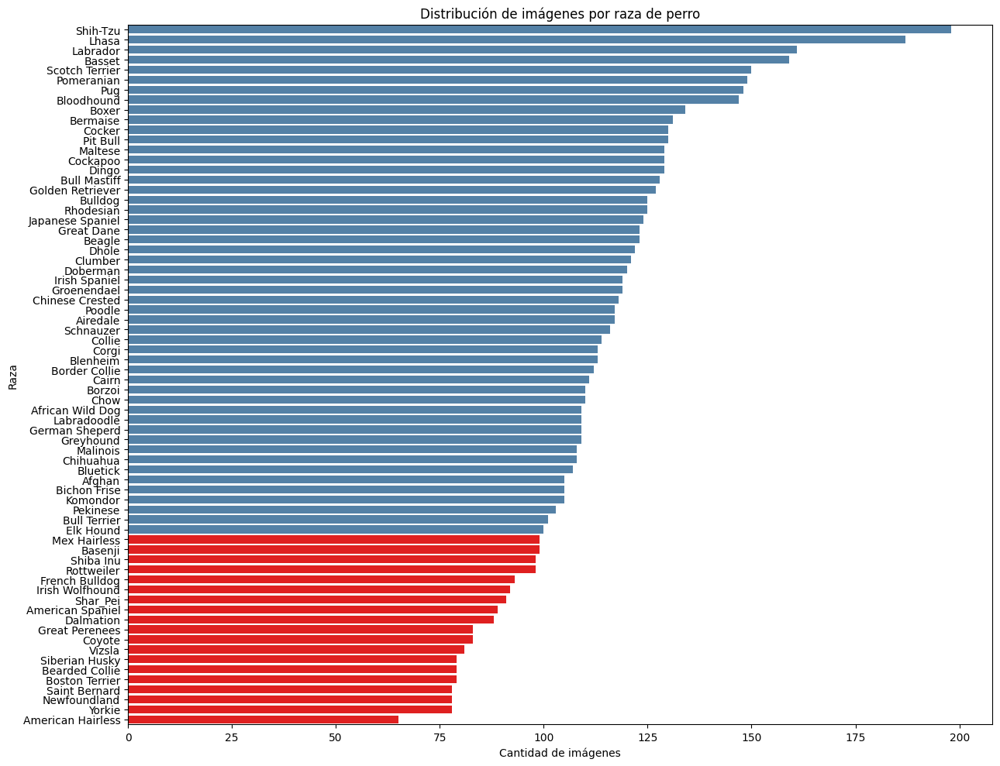

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

#quitar warning
import warnings
warnings.filterwarnings('ignore')

#plot
counts = dogs_train['labels'].value_counts()
colors = ['red' if count < 100 else 'steelblue' for count in counts]
plt.figure(figsize=(13, 10))
sns.barplot(y = counts.index, x=counts.values, palette=colors)
plt.title('Distribución de imágenes por raza de perro')
plt.xlabel('Cantidad de imágenes')
plt.ylabel('Raza')
plt.tight_layout()
plt.show()

El dataset presenta desbalance de clases. Los modelos entrenados podrían tener un sesgo hacia la raza Shih-Tzu y Lhasa, y costarle predecir algunas razas como el Terrier Americano (American Hairless). En rojo están todas las que tienen menos de 100 imágenes

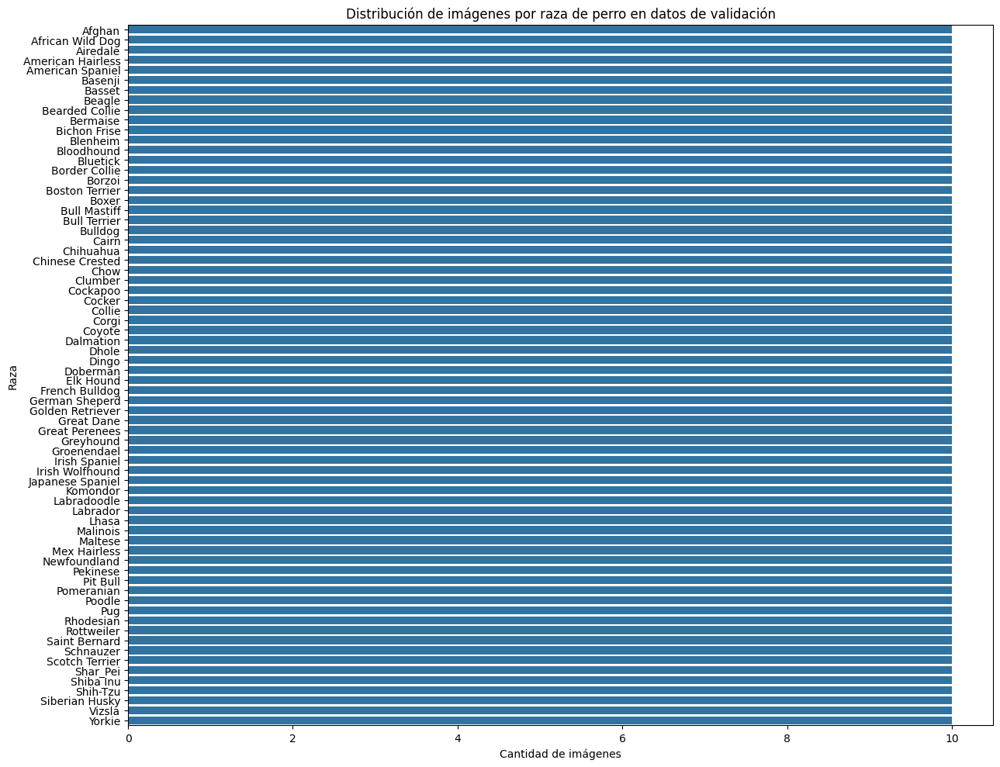

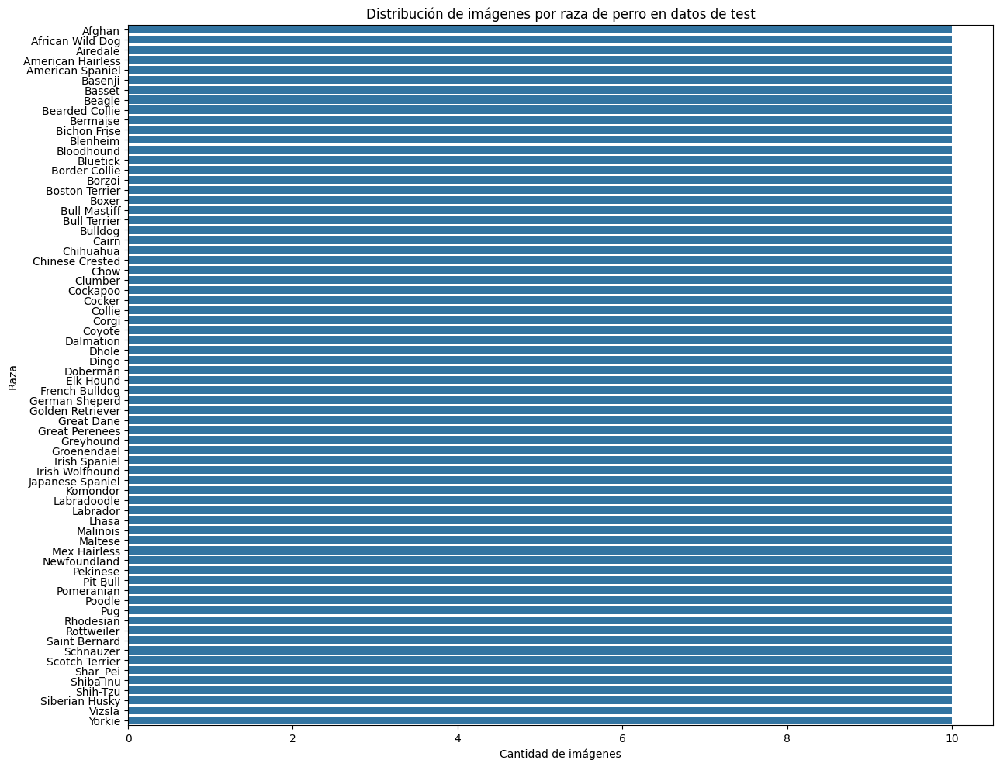

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

#quitar warning
import warnings
warnings.filterwarnings('ignore')

#plot
counts = dogs_test['labels'].value_counts()
plt.figure(figsize=(13, 10))
sns.barplot(y = counts.index, x=counts.values)
plt.title('Distribución de imágenes por raza de perro en datos de validación')
plt.xlabel('Cantidad de imágenes')
plt.ylabel('Raza')
plt.tight_layout()
plt.show()

#plot
counts = dogs_test['labels'].value_counts()
plt.figure(figsize=(13, 10))
sns.barplot(y = counts.index, x=counts.values)
plt.title('Distribución de imágenes por raza de perro en datos de test')
plt.xlabel('Cantidad de imágenes')
plt.ylabel('Raza')
plt.tight_layout()
plt.show()

Se nota que hay 10 imágenes por raza en los sets separados de test y validación. Cada uno tiene 700 registros en el csv

##1.1. Creación de la BBDD vectorial

###Embeddings
Primero extraemos los vectores de características de las imágenes del dataset

In [ ]:
import pandas as pd
import numpy as np
import os
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tqdm import tqdm

# 1. Filtrar solo imágenes de entrenamiento
dogs_train = dogs[dogs['data set'] == 'train'].reset_index(drop=True)

# 2. Crear el modelo base ResNet
model = ResNet50(weights='imagenet',
                 include_top=False,
                 pooling='avg')

# 3. Función para obtener embedding de una imagen con ResNet
def get_embedding(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    embedding = model.predict(x, verbose=0)
    return embedding.flatten()

In [6]:
# 4. Crear embeddings y asociarlos con sus labels y paths
embeddings = []
labels = [] #borrar luego
filepaths = [] #borrar luego

for i, row in tqdm(dogs_train.iterrows(), total=len(dogs_train)):
    full_path = os.path.join('/content/70-dog-breedsimage-data-set', row['filepaths'])
    try:
        emb = get_embedding(full_path)
        embeddings.append(emb)
        labels.append(row['labels'])
        filepaths.append(full_path)
    except Exception as e:
        print(f"Error procesando {full_path}: {e}")

# 5. Guardar resultados
embeddings = np.array(embeddings)
np.save('dog_embeddings.npy', embeddings)

print("✅ Embeddings guardados.")

100%|██████████| 7946/7946 [49:14<00:00,  2.69it/s]

✅ Embeddings y metadata guardados.


###Indexación
Ahora indexaremos los vectores en la BBDD vectorial elegida: FAISS

In [13]:
!pip install faiss-cpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.3/31.3 MB 68.6 MB/s eta 0:00:00


In [14]:
import faiss
import numpy as np

# Cargar los embeddings
embeddings = np.load('dog_embeddings.npy').astype('float32')  #FAISS requiere float32

# Verificar dimensiones
print("Shape de embeddings:", embeddings.shape)  # (N, 2048)

# Crear el índice FAISS
index = faiss.IndexFlatL2(embeddings.shape[1])  # 2048

# Agregar los vectores al índice
index.add(embeddings)

# Confirmar que se indexaron
print(f"Total de vectores indexados: {index.ntotal}")

Shape de embeddings: (7946, 2048)
Total de vectores indexados: 7946


In [15]:
#guardo el index
faiss.write_index(index, 'dogs_index_resnet50.faiss')

##1.2. Desarrollo de la App en Gradio y Clasificación Basada en Similitud

In [10]:
!pip install gradio

In [44]:
import gradio as gr
import pandas as pd
from collections import Counter
from PIL import Image
import numpy as np # Import numpy
import os # Import os
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input # Import necessary keras modules
from tensorflow.keras.preprocessing import image # Import necessary keras modules

# Ruta base a las imágenes
BASE_PATH = '/content/70-dog-breedsimage-data-set'

# Función para procesar imagen y buscar similares
def buscar_y_predecir(img):
    # Convertir a formato compatible
    img = img.convert("RGB").resize((224, 224))
    x = np.array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    emb = model.predict(x, verbose=0).astype('float32')

    # Búsqueda FAISS
    distancias, indices = index.search(emb, 10)

    # Recuperar paths y razas
    paths = [os.path.join(BASE_PATH, dogs.iloc[i]['filepaths']) for i in indices[0]]
    razas = [dogs.iloc[i]['labels'] for i in indices[0]]

    # Voto mayoritario
    prediccion = Counter(razas).most_common(1)[0][0]

    # Cargar imágenes para mostrar
    imgs_similares = [Image.open(p).resize((224, 224)) for p in paths] #las imgs creo que ya estan en ese size. verificar

    return prediccion, imgs_similares

# Gradio Interface
demo = gr.Interface(
    fn=buscar_y_predecir,
    inputs=gr.Image(type="pil", label="Subí la imagen de un perro"),
    outputs=[
        gr.Label(label="Raza Predicha"),
        gr.Gallery(label="10 imágenes más similares", columns=5, rows="auto", height="auto") # Modified styling here
    ],
    title="Buscador de Razas de Perros por Similitud",
    description="Subí la imagen de un perro y te mostramos las 10 más similares del dataset, junto con la predicción de su raza."
)

demo.launch()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://86747cf641dbc9066b.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


La foto del perrito que subí es difícil, es un mestizo de raza Shih-tzu y Pekinés (ambas están en el dataset), y ResNet no está optimizado para perros. Si esperaba una predicción con alguna de esas razas fue sobre todo porque el dataset tiene mayoría de fotos del Shih-tzu. Sin embargo, las fotos que trajo sí tienen similitudes apreciables con la subida, y la raza predicha (Chin japonés) tiene características similares al perrito de la foto. Veremos a lo largo del TP si la clasificación de esta imágen mejora

In [45]:
demo.launch()

Rerunning server... use `close()` to stop if you need to change `launch()` parameters.
----
It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://86747cf641dbc9066b.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


##1.3. Métrica de Evaluación



Defino NDCG@k

In [16]:
import numpy as np

def ndcg_at_k(relevancias, k=10):
    relevancias = np.asarray(relevancias)[:k]
    if relevancias.size == 0:
        return 0.0
    # Asegurarnos que relevancias es un array de numpy para los cálculos
    relevancias = np.asarray(relevancias)
    dcg = np.sum((2**relevancias - 1) / np.log2(np.arange(2, relevancias.size + 2)))
    ideal_relevancias = sorted(relevancias, reverse=True)
    # Nos aseguramos con ideal_relevancias también
    ideal_relevancias = np.asarray(ideal_relevancias)
    idcg = np.sum((2**ideal_relevancias - 1) / np.log2(np.arange(2, len(ideal_relevancias) + 2)))
    return dcg / idcg if idcg > 0 else 0.0

Ejecuto evaluación

In [17]:
from tqdm import tqdm
from collections import defaultdict
from PIL import Image

# Filtrar test set
dogs_test = dogs[dogs['data set'] == 'test'].reset_index(drop=True)

# Limitar a 5 imágenes por raza
n = 5 #puedo elegir entre 5-10 según enunciado
dogs_test_sample = dogs_test.groupby('labels').sample(n=n, random_state=42)

resultados = []

for _, row in tqdm(dogs_test_sample.iterrows(), total=len(dogs_test_sample)):
    img_path = os.path.join(BASE_PATH, row['filepaths'])
    raza_true = row['labels']

    # Extraer embedding de test
    img = Image.open(img_path).convert("RGB").resize((224, 224))
    x = np.expand_dims(np.array(img), axis=0)
    x = preprocess_input(x)
    emb = model.predict(x, verbose=0).astype('float32')

    # Buscar similares
    _, indices = index.search(emb, 10)

    # Obtener razas recuperadas
    razas_recuperadas = [dogs.iloc[i]['labels'] for i in indices[0]]

    # Relevancias binarias
    relevancias = [1 if r == raza_true else 0 for r in razas_recuperadas]

    # Calcular NDCG
    ndcg = ndcg_at_k(relevancias, k=10)
    resultados.append(ndcg)

# Resultado final
ndcg_promedio = np.mean(resultados)
print(f"\nNDCG@10 promedio sobre el conjunto de prueba: {ndcg_promedio:.4f}")

100%|██████████| 350/350 [02:16<00:00,  2.56it/s]


NDCG@10 promedio sobre el conjunto de prueba: 0.9505


Como 1 sería perfecto, que la métrica nos de 0.9505 indica que mi sistema de búsqueda por similitud está funcionando muy bien: recupera imágenes relevantes y además las posiciona correctamente en los primeros lugares del ranking.

#Etapa 2: Entrenamiento y Comparación de Modelos de Clasificación

En esta etapa, se entrena mi propio modelo para mejorar la representación de las características y la clasificación.



## 2.1. Modelo Transfer Learning

Se realiza fine-tuning de ResNet18 sobre el dataset de 70 razas de perros. Para esto, vamos a usar PyTorch

In [7]:
!pip install torch torchvision pandas scikit-learn --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 84.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 62.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 842.4 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 110.0 MB/s eta 0:00:00


Clase para preparar Dataset:

In [7]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from torchvision import transforms
from PIL import Image
from torch.utils.data import Dataset

class DogDataset(Dataset):
    def __init__(self, dataframe, base_path, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.base_path = base_path
        self.transform = transform

        # Codificar labels
        self.label_encoder = LabelEncoder()
        self.df['label_encoded'] = self.label_encoder.fit_transform(self.df['labels'])

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = f"{self.base_path}/{self.df.iloc[idx]['filepaths']}"
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        label = self.df.iloc[idx]['label_encoded']
        return image, label

Creación DataLoaders:

In [8]:
import torch
from torch.utils.data import DataLoader, random_split

base_path = '/content/70-dog-breedsimage-data-set'

# Transformaciones
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Dividir por 'data set' del CSV
dogs_train = dogs[dogs['data set'] == 'train']
dogs_val = dogs[dogs['data set'] == 'valid']
dogs_test = dogs[dogs['data set'] == 'test']

train_dataset = DogDataset(dogs_train, base_path, transform=transform_train)
val_dataset = DogDataset(dogs_val, base_path, transform=transform_val)
test_dataset = DogDataset(dogs_test, base_path, transform=transform_val)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

Definir modelo y el entrenamiento:

In [9]:
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import f1_score
from tqdm import tqdm
import numpy as np
from torchvision import models

# Configuración
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
best_f1 = 0 #Usamos la métrica F1 porque vimos que el dataset en train era desbalanceado, así que esta es la métrica adecuada para evaluar el modelo
patience = 5 #para Early Stopping
patience_counter = 0

# Modelo
model = models.resnet18(weights='IMAGENET1K_V1')
model.fc = nn.Linear(model.fc.in_features, 70)  # 70 clases
model = model.to(device)

# Pérdida y optimizador
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# Funciones auxiliares
def train(model, loader):
    model.train()
    running_loss = 0
    for images, labels in tqdm(loader, desc='Entrenando'):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    return running_loss / len(loader.dataset)

def evaluate_f1(model, loader):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu()
            all_preds.extend(preds.numpy())
            all_labels.extend(labels.numpy())
    return f1_score(all_labels, all_preds, average='macro')

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 185MB/s]


Entrenamiento:

In [10]:
# Entrenamiento con early stopping
for epoch in range(1, 21):
    print(f"\n🟢 Epoch {epoch}")

    train_loss = train(model, train_loader)
    f1_val = evaluate_f1(model, val_loader)

    print(f"Train Loss: {train_loss:.4f} | F1 macro (val): {f1_val:.4f}")

    # Guardar mejor modelo
    if f1_val > best_f1:
        best_f1 = f1_val
        torch.save(model.state_dict(), 'mejor_modelo_resnet18.pt')
        print("✅ Modelo mejorado. Guardado.")
        patience_counter = 0
    else:
        patience_counter += 1
        print(f"⏳ Sin mejora. Paciencia: {patience_counter}/{patience}")
        if patience_counter >= patience:
            print("🛑 Early stopping activado.")
            break


🟢 Epoch 1


Entrenando: 100%|██████████| 249/249 [00:45<00:00,  5.51it/s]


Train Loss: 1.7038 | F1 macro (val): 0.9216
✅ Modelo mejorado. Guardado.

🟢 Epoch 2


Entrenando: 100%|██████████| 249/249 [00:45<00:00,  5.47it/s]


Train Loss: 0.4846 | F1 macro (val): 0.9427
✅ Modelo mejorado. Guardado.

🟢 Epoch 3


Entrenando: 100%|██████████| 249/249 [00:38<00:00,  6.49it/s]


Train Loss: 0.2512 | F1 macro (val): 0.9551
✅ Modelo mejorado. Guardado.

🟢 Epoch 4


Entrenando: 100%|██████████| 249/249 [00:38<00:00,  6.48it/s]


Train Loss: 0.1364 | F1 macro (val): 0.9681
✅ Modelo mejorado. Guardado.

🟢 Epoch 5


Entrenando: 100%|██████████| 249/249 [00:38<00:00,  6.41it/s]


Train Loss: 0.0889 | F1 macro (val): 0.9446
⏳ Sin mejora. Paciencia: 1/5

🟢 Epoch 6


Entrenando: 100%|██████████| 249/249 [00:38<00:00,  6.51it/s]


Train Loss: 0.0621 | F1 macro (val): 0.9595
⏳ Sin mejora. Paciencia: 2/5

🟢 Epoch 7


Entrenando: 100%|██████████| 249/249 [00:38<00:00,  6.40it/s]


Train Loss: 0.0400 | F1 macro (val): 0.9617
⏳ Sin mejora. Paciencia: 3/5

🟢 Epoch 8


Entrenando: 100%|██████████| 249/249 [00:38<00:00,  6.48it/s]


Train Loss: 0.0307 | F1 macro (val): 0.9520
⏳ Sin mejora. Paciencia: 4/5

🟢 Epoch 9


Entrenando: 100%|██████████| 249/249 [00:38<00:00,  6.51it/s]


Train Loss: 0.0184 | F1 macro (val): 0.9590
⏳ Sin mejora. Paciencia: 5/5
🛑 Early stopping activado.


###Evaluación de Métricas


🔍 Reporte de Clasificación:

              precision    recall  f1-score   support

           0     1.0000    1.0000    1.0000        10
           1     1.0000    1.0000    1.0000        10
           2     1.0000    1.0000    1.0000        10
           3     0.9091    1.0000    0.9524        10
           4     0.8182    0.9000    0.8571        10
           5     0.8333    1.0000    0.9091        10
           6     1.0000    1.0000    1.0000        10
           7     1.0000    1.0000    1.0000        10
           8     1.0000    1.0000    1.0000        10
           9     1.0000    1.0000    1.0000        10
          10     1.0000    1.0000    1.0000        10
          11     1.0000    1.0000    1.0000        10
          12     1.0000    1.0000    1.0000        10
          13     1.0000    1.0000    1.0000        10
          14     1.0000    1.0000    1.0000        10
          15     1.0000    1.0000    1.0000        10
          16     0.6667    1.0000    0.8000        

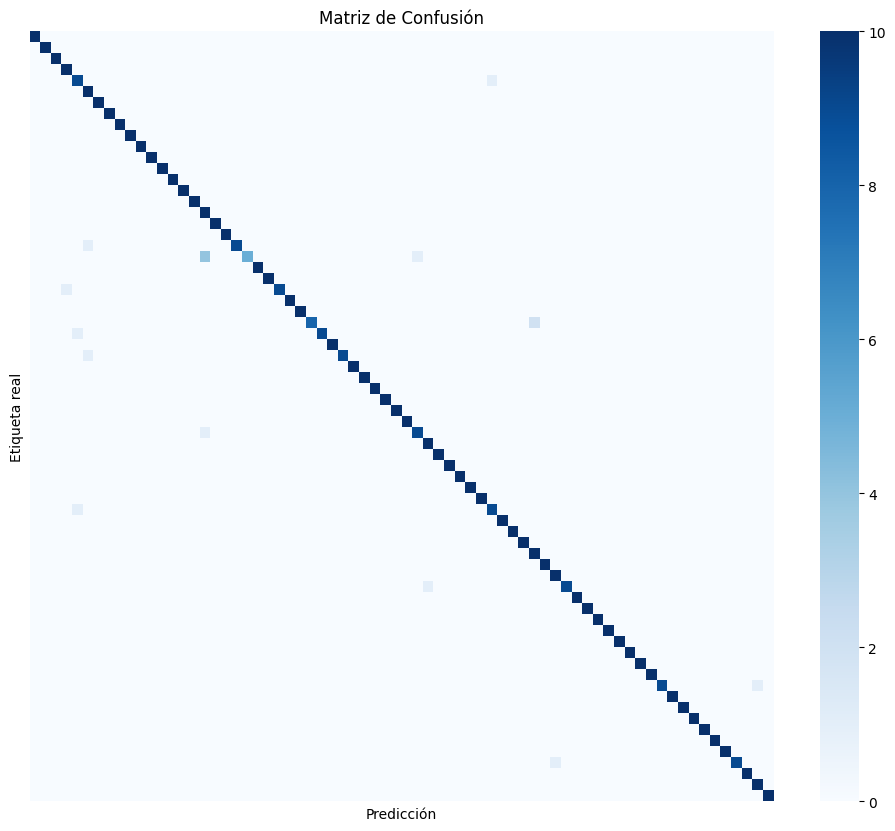

In [11]:
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, f1_score, precision_score, recall_score
)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Cargar el mejor modelo
# model.load_state_dict(torch.load("mejor_modelo_resnet18.pt"))
# model.to(device)
model.eval()

# 2. Obtener predicciones en test
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1).cpu()
        all_preds.extend(preds.numpy())
        all_labels.extend(labels.numpy())

# 3. Reporte general
print("\n🔍 Reporte de Clasificación:\n")
print(classification_report(all_labels, all_preds, digits=4))

print(f"✅ Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"✅ F1 macro: {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"✅ F1 micro: {f1_score(all_labels, all_preds, average='micro'):.4f}")
print(f"✅ Precision macro: {precision_score(all_labels, all_preds, average='macro'):.4f}")
print(f"✅ Recall macro: {recall_score(all_labels, all_preds, average='macro'):.4f}")

# 4. Especificidad por clase
cm = confusion_matrix(all_labels, all_preds)
num_classes = cm.shape[0]
specificities = []

for i in range(num_classes):
    TP = cm[i, i]
    FP = cm[:, i].sum() - TP
    FN = cm[i, :].sum() - TP
    TN = cm.sum() - (TP + FP + FN)
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0.0
    specificities.append(specificity)

print(f"✅ Especificidad promedio: {np.mean(specificities):.4f}")

# Opcional: mostrar especificidad por clase
# for i, spec in enumerate(specificities):
#     print(f"Clase {i}: Especificidad = {spec:.4f}")

# 5. Matriz de confusión
plt.figure(figsize=(12, 10))
sns.heatmap(cm, cmap="Blues", xticklabels=False, yticklabels=False)
plt.title("Matriz de Confusión")
plt.xlabel("Predicción")
plt.ylabel("Etiqueta real")
plt.show()

Esta evaluación fue realizada sobre el conjunto de prueba (test) (700 imágenes, 70 razas, 10 imágenes por clase):

- Exactitud global (Accuracy): 97.57%  
    --> Esto indica que el modelo clasificó correctamente 684 de las 700 imágenes. Métrica especialmente informativa dado que el dataset está balanceado (todas las clases tienen igual cantidad de muestras).

- F1-score macro: 97.53%  
    (Calcula el promedio del F1-score de todas las clases sin ponderar por frecuencia.)  
    --> Muestra que el modelo tiene un desempeño consistente entre las 70 razas, incluso las más difíciles.
    Es ideal para evaluar clasificación multiclase balanceada como esta.

- F1-score micro: 97.57%  
    (Calcula el F1-score a nivel global, considerando todos los aciertos y errores.)  
    --> Al coincidir prácticamente con el accuracy, nos confirma que el modelo no favorece unas clases sobre otras, como pasaría si evaluásemos el conjunto de train en vez de test.

- Precisión macro: 97.98%  
    (Promedio de precisión por clase (proporción de predicciones correctas entre todas las hechas para cada clase)).  
    --> Alto valor = el modelo comete muy pocos falsos positivos.

- Recall macro: 97.57%
    (Promedio de recall por clase (proporción de verdaderos positivos identificados)).
    --> Alto recall = el modelo reconoce casi todas las instancias verdaderas de cada raza.

- Especificidad promedio: 99.96%
    (La especificidad mide la proporción de verdaderos negativos correctamente identificados.)  
    --> Cercana al 1 indica que el modelo no se confunde casi nunca (y es lo que vemos en la matriz de confusión): si una imagen no es de una determinada raza, el modelo casi nunca predice erróneamente que lo es. Esto complementa al recall, y sugiere un balance ideal entre sensibilidad y especificidad.

- Matriz de Confusión  
    Presenta una diagonal muy fuerte y casi perfecta, lo que refleja la clasificación correcta clase por clase.  
    Las pocas confusiones deben ocurrir en razas que pueden compartir características visuales.

En conclusión, el modelo ResNet18 fine-tuneado con PyTorch muestra un rendimiento sobresaliente en la tarea de clasificación de 70 razas de perros. Las métricas obtenidas fueron todas muy altas e indican excelente precisión general.


##2.2: Integración y Selección en la App Gradio

Como no hice el modelo opcional, en el menú desplegable voy a permitir que el usuario elija entre el modelo ResNet 18 con fine-tuning y el anterior trabajado de ResNet 50.

Ya tenía guardado el index de ResNet 50. Genero el de ResNet18:

In [19]:
import torch
from torchvision import transforms
from PIL import Image
import numpy as np
import pandas as pd
import os
from tqdm import tqdm

# Transformación igual a la del entrenamiento
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Dataset
dogs_train = dogs[dogs['data set'] == 'train'].reset_index(drop=True)

def get_embedding_pytorch(img_path):
    try:
        img = Image.open(img_path).convert("RGB")
        img = transform(img).unsqueeze(0).to(device)  # Asegura que la imagen vaya a la GPU si el modelo está en GPU
        with torch.no_grad():
            embedding = model(img)
        return embedding.cpu().numpy().flatten()  # Lo devolvemos a CPU para guardar como numpy
    except Exception as e:
        print(f"Error en {img_path}: {e}")
        return None

### Embeddings ResNet18

In [20]:
embeddings = []
labels = []
filepaths = []

for i, row in tqdm(dogs_train.iterrows(), total=len(dogs_train)):
    full_path = os.path.join('/content/70-dog-breedsimage-data-set', row['filepaths'])
    try:
        emb = get_embedding_pytorch(full_path)
        embeddings.append(emb)
        labels.append(row['labels'])
        filepaths.append(full_path)
    except Exception as e:
        print(f"Error en {full_path}: {e}")

embeddings = np.array(embeddings).astype('float32')
np.save('dog_embeddings_resnet18.npy', embeddings)

print("✅ Embeddings de ResNet18 guardados.")

100%|██████████| 7946/7946 [00:44<00:00, 178.34it/s]

✅ Embeddings de ResNet18 guardados.


### Indexación

In [21]:
import faiss

dim = embeddings.shape[1]
index_resnet18 = faiss.IndexFlatL2(dim)
index_resnet18.add(embeddings)
faiss.write_index(index_resnet18, "faiss_resnet18.index")

print("✅ Índice FAISS de ResNet18 creado y guardado.")

✅ Índice FAISS de ResNet18 creado y guardado.


### App actualizada de Gradio

In [9]:
import gradio as gr
import pandas as pd
from collections import Counter
from PIL import Image
import numpy as np
import os
import torch
from torchvision import transforms, models
import torch.nn as nn
import faiss
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input as preprocess_keras
from tensorflow.keras.preprocessing import image

In [3]:
#Función para cuando necesite cargar ResNet18
# Reconstruimos el modelo exactamente igual que antes
def modelo_transferido(state_dict):
    model = models.resnet18(weights=None)  # No cargamos pesos de ImageNet
    model.fc = nn.Linear(model.fc.in_features, 70)
    model.load_state_dict(state_dict)
    model.to(device)
    model.eval()
    return model

In [39]:
# Cargar modelo base ResNet50
model_keras = ResNet50(weights='imagenet', include_top=False, pooling='avg')

#Cargar modelo ResNet18
# Forzamos uso de CPU
device = torch.device("cpu")

# Cargar el state_dict desde el archivo y reconstruir el modelo
state_dict = torch.load("mejor_modelo_resnet18.pt", map_location=device)
model_pytorch = modelo_transferido(state_dict)

# Dataset
BASE_PATH = '/content/70-dog-breedsimage-data-set'

# FAISS
# index_resnet50 = faiss.read_index("dogs_index_resnet50.faiss")
# index_resnet18 = faiss.read_index("faiss_resnet18.index")

# Transformación PyTorch
transform_pytorch = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

def extraer_embedding(img, modelo):
    if modelo == "ResNet50 (Keras)":
        img = img.convert("RGB").resize((224, 224))
        x = np.array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_keras(x)
        emb = model_keras.predict(x, verbose=0).astype('float32')
    else:
        img_tensor = transform_pytorch(img).unsqueeze(0).to(device)
        with torch.no_grad():
            emb = model_pytorch(img_tensor).numpy().astype('float32')
    return emb

def buscar_y_predecir(img, modelo):
    emb = extraer_embedding(img, modelo)

    # Elegir índice FAISS según modelo
    index = index_resnet50 if modelo == "ResNet50 (Keras)" else index_resnet18

    distancias, indices = index.search(emb, 10)

    paths = [os.path.join(BASE_PATH, dogs.iloc[i]['filepaths']) for i in indices[0]]
    razas = [dogs.iloc[i]['labels'] for i in indices[0]]
    prediccion = Counter(razas).most_common(1)[0][0]
    imgs_similares = [Image.open(p).resize((224, 224)) for p in paths]

    return prediccion, imgs_similares

# Gradio Interface
demo = gr.Interface(
    fn=buscar_y_predecir,
    inputs=[
        gr.Image(type="pil", label="Subí la imagen de un perrito"),
        gr.Dropdown(choices=["ResNet50 (Keras)", "ResNet18 (entrenado)"], value="ResNet50 (Keras)", label="Modelo a utilizar")
    ],
    outputs=[
        gr.Label(label="Raza Predicha"),
        gr.Gallery(label="10 imágenes más similares", columns=5)
    ],
    title="Buscador de Razas de Perros por Similitud",
    description="Subí la imagen de un perrito y elegí el modelo para buscar las 10 más similares. Se muestra la raza estimada por voto mayoritario."
)

demo.launch(share=True, debug=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://8d32c4944468eadae2.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7861 <> https://8d32c4944468eadae2.gradio.live


Trajo diferentes imágenes similares a comparación de cuando usamos resnet50. Ahora son más parecidas. Volví a intentar con el perrito mestizo para ver si este modelo reconocía alguna de las razas padre, pero no sucede

# Etapa 3: Pipeline de Detección y Clasificación en Escenas Complejas

###3.1 Detección de Objetos

Cargo YOLO

In [11]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 45.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 783.1 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 62.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [37]:
from ultralytics import YOLO
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Cargar modelo YOLOv8 preentrenado
yolo_model = YOLO("yolov8m.pt")  # yolov8m.pt es más potente que yolov8n

Pruebo un ejemplo usando una foto con múltiples objetos y perritos


0: 384x640 7 persons, 12 dogs, 2 backpacks, 1 frisbee, 6 sports balls, 1227.7ms
Speed: 4.8ms preprocess, 1227.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


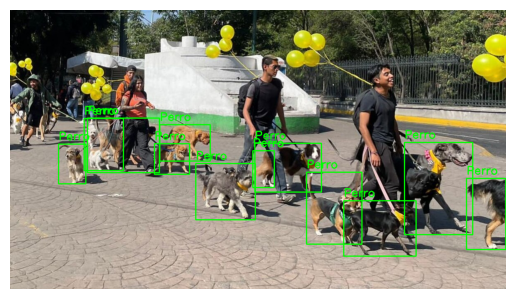

In [19]:
# Cargar imagen
img_path = "/content/ejemplo.jpg"
img = cv2.imread(img_path)

# Inferencia
results = yolo_model(img)[0]

# Filtrar solo objetos de clase "perro" (class_id = 16 en COCO)
dog_boxes = [box for box in results.boxes.data.cpu().numpy() if int(box[5]) == 16]

# Dibujar bounding boxes
for box in dog_boxes:
    x1, y1, x2, y2 = map(int, box[:4])
    cv2.rectangle(img, (x1, y1), (x2, y2), (0,255,0), 2)
    cv2.putText(img, "Perro", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,255,0), 2)

# Mostrar
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

###3.2 Creación del Pipeline Completo

In [ ]:
import torch
from ultralytics import YOLO
from torchvision import transforms
from PIL import Image
import cv2
import numpy as np
import gradio as gr
import pandas as pd

# Cargar modelo ResNet18 entrenado (fine-tuned)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelo_resnet18_state_dict = torch.load("mejor_modelo_resnet18.pt", map_location=device)
modelo_resnet18 = modelo_transferido(modelo_resnet18_state_dict)
modelo_resnet18.eval()

# Dataset de razas
razas = dogs['labels'].unique()

# Transformación igual a la de entrenamiento
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [17]:
# Función principal del pipeline
def detectar_y_clasificar(img_pil):
    img_cv = cv2.cvtColor(np.array(img_pil), cv2.COLOR_RGB2BGR)
    results = yolo_model(img_cv)[0]

    # Bounding boxes de perros (class_id 16)
    perros = [box for box in results.boxes.data.cpu().numpy() if int(box[5]) == 16]

    for i, box in enumerate(perros):
        x1, y1, x2, y2 = map(int, box[:4])
        crop = img_pil.crop((x1, y1, x2, y2))

        # Clasificar con modelo ResNet18
        tensor = transform(crop).unsqueeze(0).to(device)
        with torch.no_grad():
            logits = modelo_resnet18(tensor)
            pred_idx = logits.argmax(dim=1).item()
            raza = razas[pred_idx]

        # Dibujar en imagen original
        cv2.rectangle(img_cv, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img_cv, raza, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

    # Convertir imagen resultante a PIL para Gradio
    result_img = Image.fromarray(cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB))
    return result_img

# Interfaz Gradio
gradio_app = gr.Interface(
    fn=detectar_y_clasificar,
    inputs=gr.Image(type="pil", label="Subí una imagen con uno o más perros"),
    outputs=gr.Image(label="Resultado con razas detectadas"),
    title="📸 Clasificador de Razas en Imágenes del Mundo Real",
    description="Usa YOLOv8 para detectar perros en una escena y un modelo personalizado para predecir su raza."
)

gradio_app.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://10b3169a47a428a523.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


#Etapa 4: Evaluación, Optimización y Herramientas de Anotación


##4.1 Evaluación del Pipeline


###Imágenes recolectadas

Carga y visualización de las imágenes que recopilé, con sus clasificaciones hechas manualmente con makesense.ai:



In [41]:
import os
import cv2
import matplotlib.pyplot as plt

# Configurá rutas
img_dir = "/content/conjunto_prueba_perritos"
ann_dir = "/content/anotaciones_perritos"

# Lista de clases en el orden que usaste al anotar
class_names = [
    "Siberian Husky", "Pug", "Golden Retriever", "Dalmatian", "Beagle", "Poodle", "Cockapoo",
    "Labrador", "Rottweiler", "Bluetick", "African Wild Dog", "Greyhound", "Yorkie", "Cocker",
    "Corgi", "Newfoundland", "Chinese Crested", "Lhasa", "Collie", "Groenendael", "Chow",
    "Pomeranian", "Chihuahua", "Schnauzer", "French Bulldog", "Doberman"
]

# Función para visualizar
def visualizar_gt(nombre_imagen):
    img_path = os.path.join(img_dir, nombre_imagen)
    ann_path = os.path.join(ann_dir, os.path.splitext(nombre_imagen)[0] + ".txt")

    # Leer imagen
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    # Leer anotaciones
    if os.path.exists(ann_path):
        with open(ann_path, 'r') as f:
            for linea in f:
                cls, cx, cy, bw, bh = map(float, linea.strip().split())
                x1 = int((cx - bw/2) * w)
                y1 = int((cy - bh/2) * h)
                x2 = int((cx + bw/2) * w)
                y2 = int((cy + bh/2) * h)
                clase = class_names[int(cls)]
                cv2.rectangle(img_rgb, (x1, y1), (x2, y2), color=(0, 255, 0), thickness=2)
                cv2.putText(img_rgb, clase, (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)
    else:
        print(f"⚠️ No se encontró anotación para {nombre_imagen}")

    # Mostrar imagen
    plt.figure(figsize=(8, 6))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title(f"Anotaciones de: {nombre_imagen}")
    plt.show()

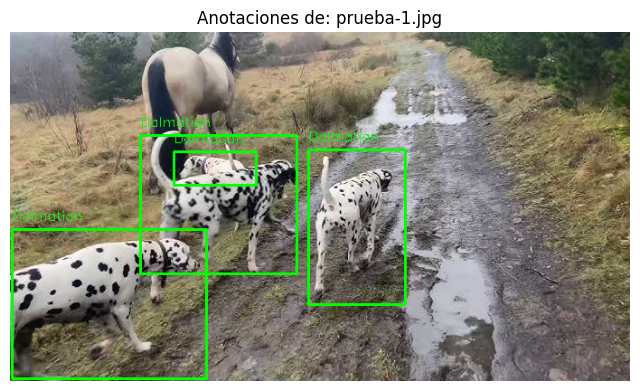

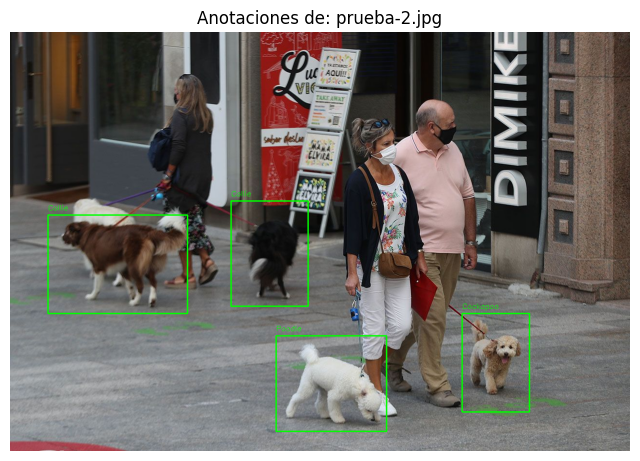

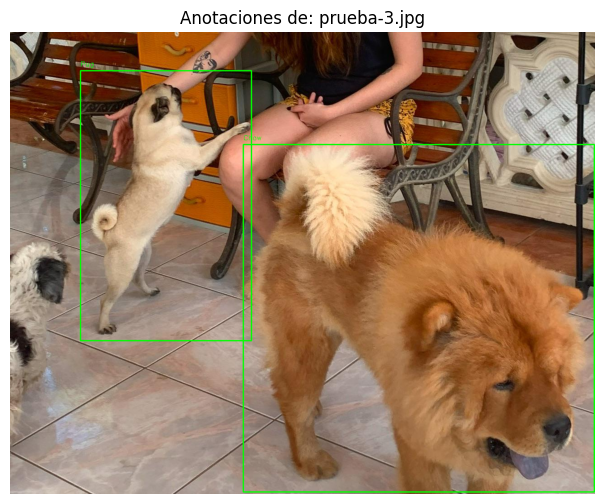

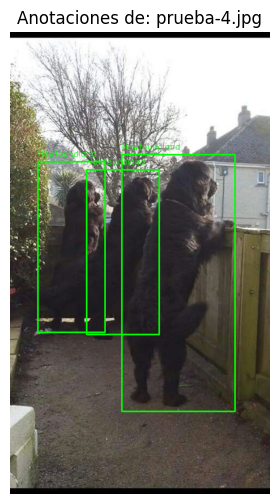

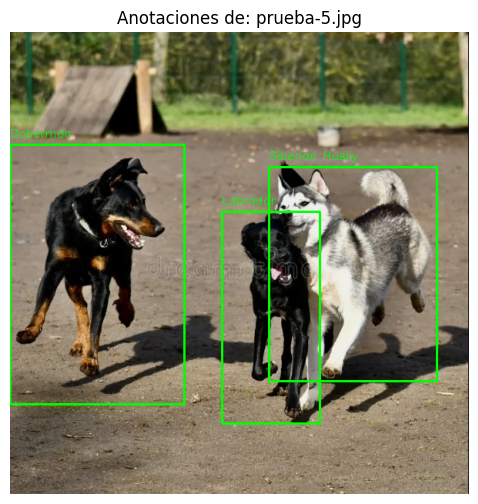

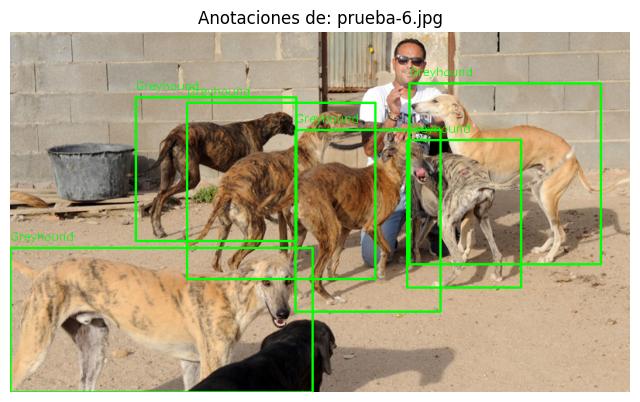

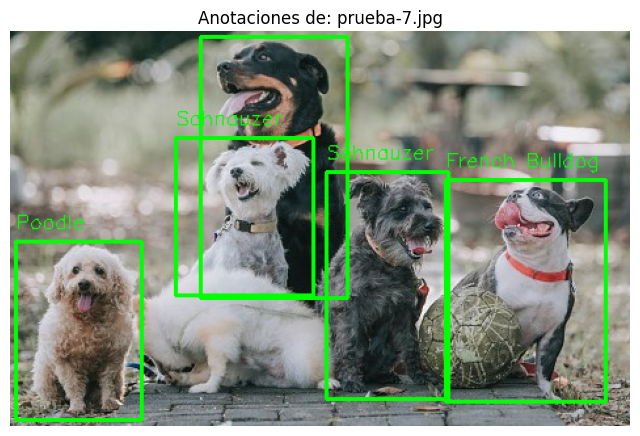

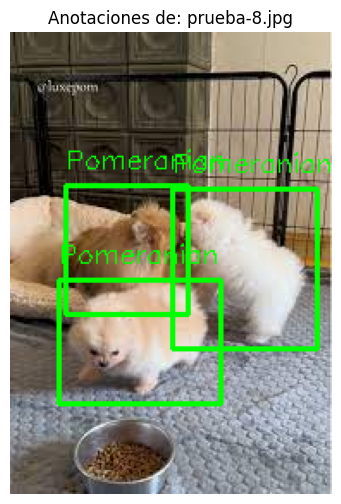

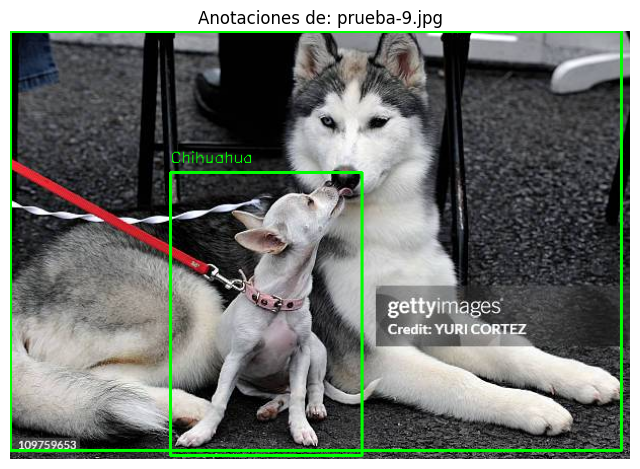

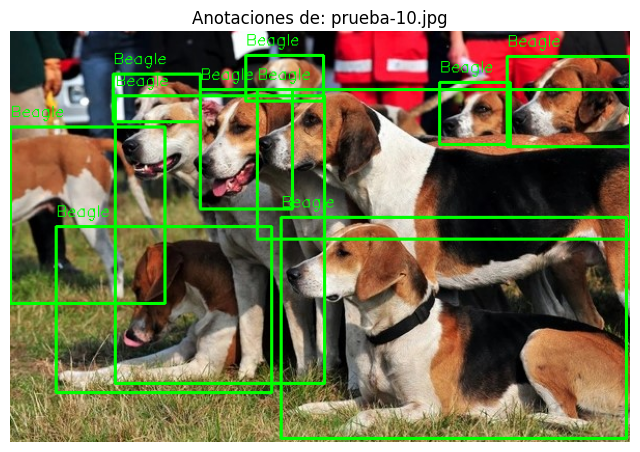

In [42]:
for i in range(1, 11):
    visualizar_gt(f"prueba-{i}.jpg")

Guardo todo en una lista de diccionarios para que sea más fácil acudir a las visualizaciones para contrastar con las predicciones luego:

In [43]:
gt_data = []

for nombre_imagen in sorted(os.listdir(img_dir)):
    if not nombre_imagen.endswith((".jpg", ".png")):
        continue

    img_path = os.path.join(img_dir, nombre_imagen)
    ann_path = os.path.join(ann_dir, os.path.splitext(nombre_imagen)[0] + ".txt")

    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ No se pudo cargar {nombre_imagen}, se saltea.")
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    boxes = []
    labels = []

    if os.path.exists(ann_path):
        with open(ann_path, 'r') as f:
            for linea in f:
                cls, cx, cy, bw, bh = map(float, linea.strip().split())
                x1 = int((cx - bw/2) * w)
                y1 = int((cy - bh/2) * h)
                x2 = int((cx + bw/2) * w)
                y2 = int((cy + bh/2) * h)
                boxes.append([x1, y1, x2, y2])
                labels.append(int(cls))
    else:
        print(f"⚠️ Sin anotaciones para {nombre_imagen}")

    gt_data.append({
        "nombre": nombre_imagen,
        "imagen": img_rgb,
        "boxes": boxes,
        "labels": labels
    })

###Predicciones


0: 384x640 2 dogs, 1 horse, 1 cow, 1167.2ms
Speed: 3.6ms preprocess, 1167.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


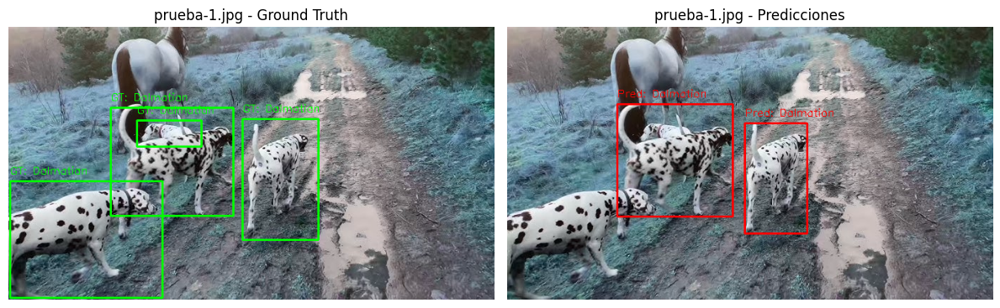


0: 448x640 6 persons, 11 dogs, 3905.3ms
Speed: 10.6ms preprocess, 3905.3ms inference, 8.4ms postprocess per image at shape (1, 3, 448, 640)


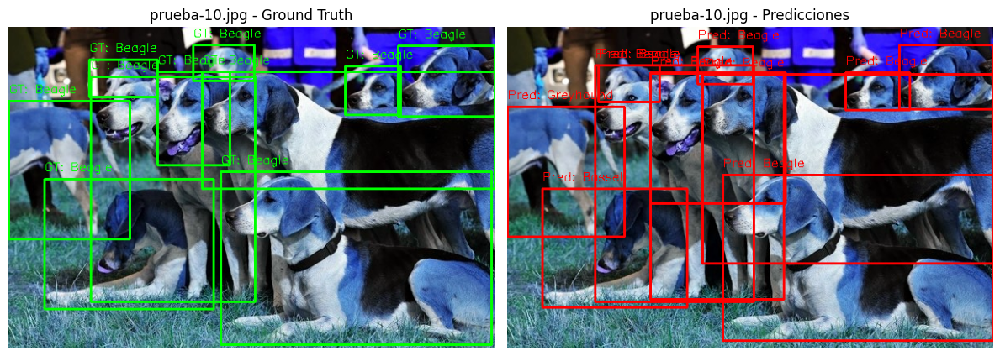


0: 448x640 3 persons, 5 dogs, 2 handbags, 2445.6ms
Speed: 11.2ms preprocess, 2445.6ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)


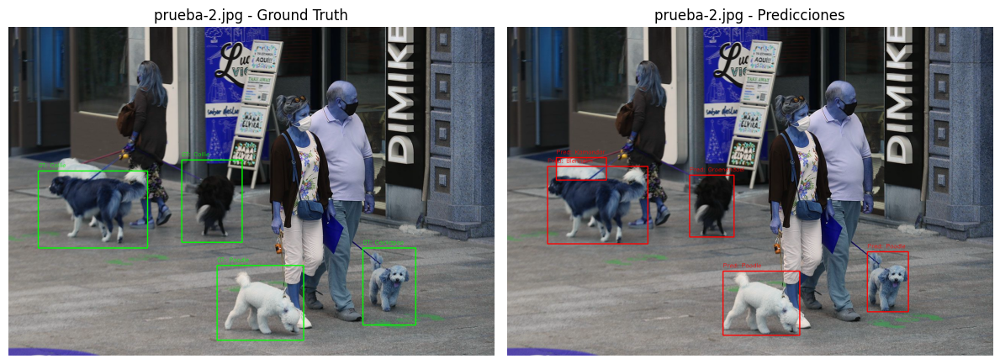


0: 512x640 1 person, 3 dogs, 2 chairs, 2393.7ms
Speed: 7.1ms preprocess, 2393.7ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)


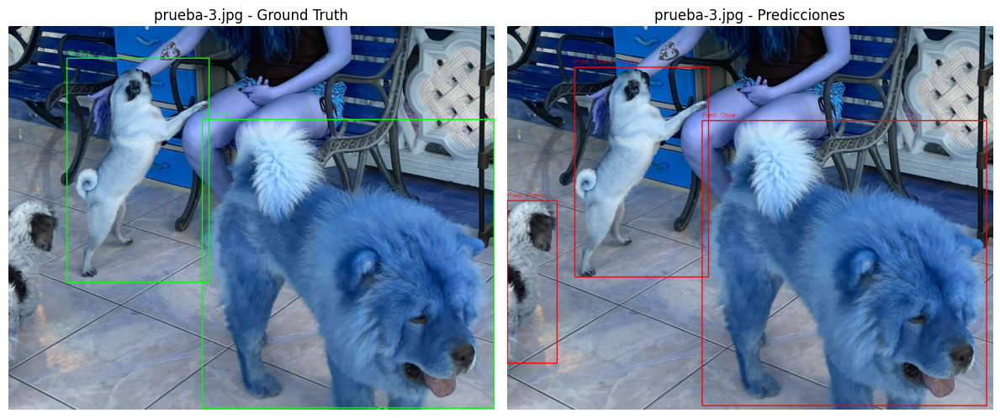


0: 640x384 1 person, 2 dogs, 2172.1ms
Speed: 16.9ms preprocess, 2172.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 384)


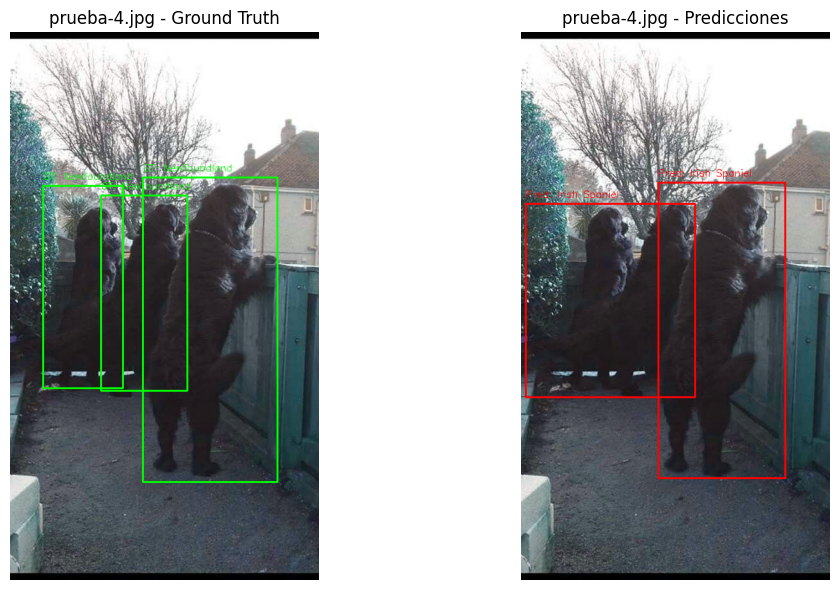


0: 640x640 3 dogs, 3821.4ms
Speed: 13.5ms preprocess, 3821.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


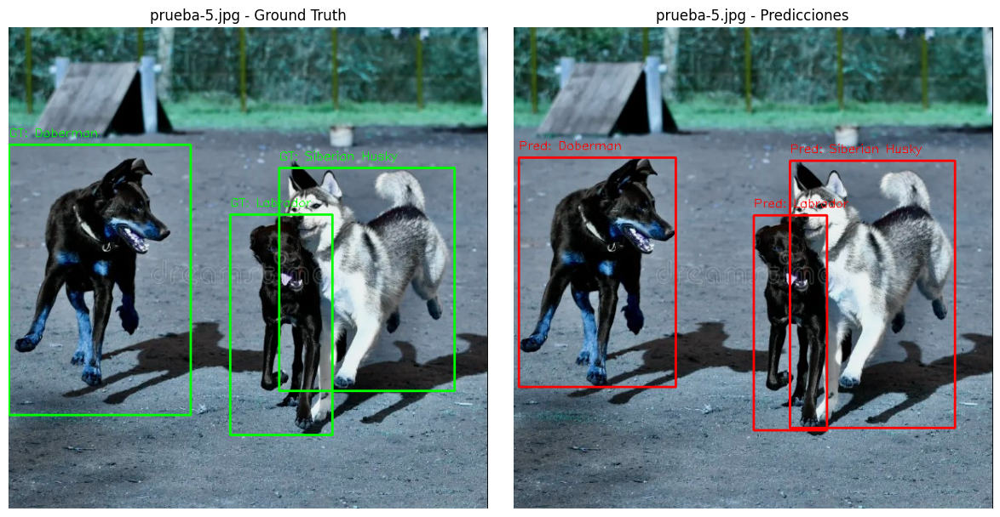


0: 384x640 1 person, 7 dogs, 3 sheeps, 997.1ms
Speed: 4.0ms preprocess, 997.1ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)


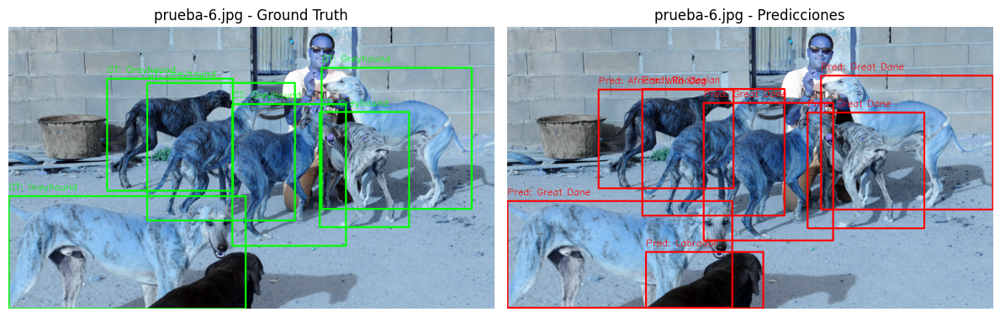


0: 416x640 6 dogs, 1 sports ball, 1729.8ms
Speed: 3.7ms preprocess, 1729.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


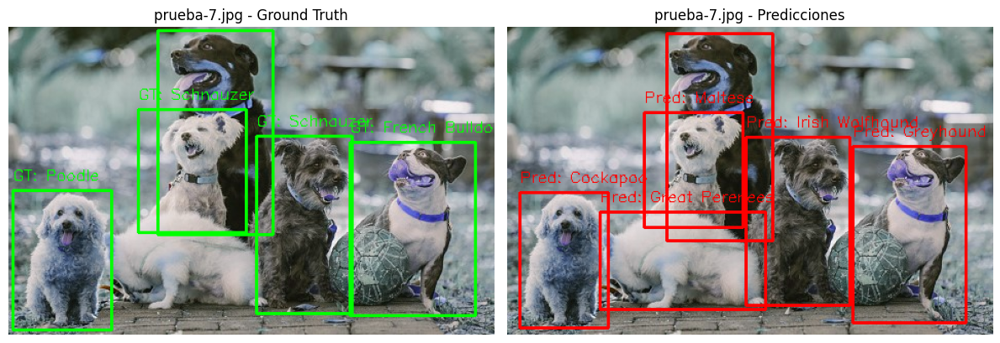


0: 640x448 3 dogs, 1 cup, 1 bowl, 1100.6ms
Speed: 18.1ms preprocess, 1100.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 448)


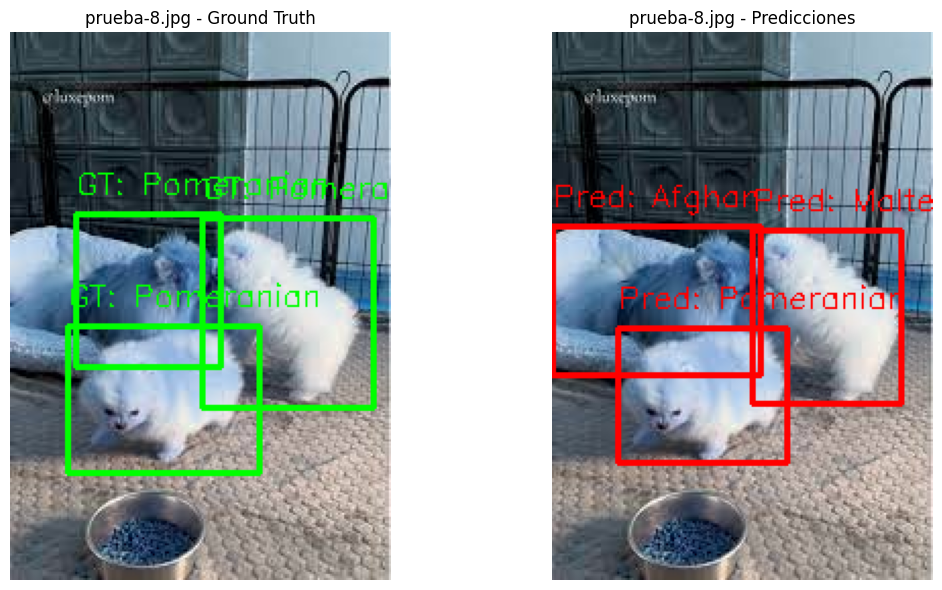


0: 448x640 1 person, 3 dogs, 3 chairs, 1233.5ms
Speed: 4.5ms preprocess, 1233.5ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


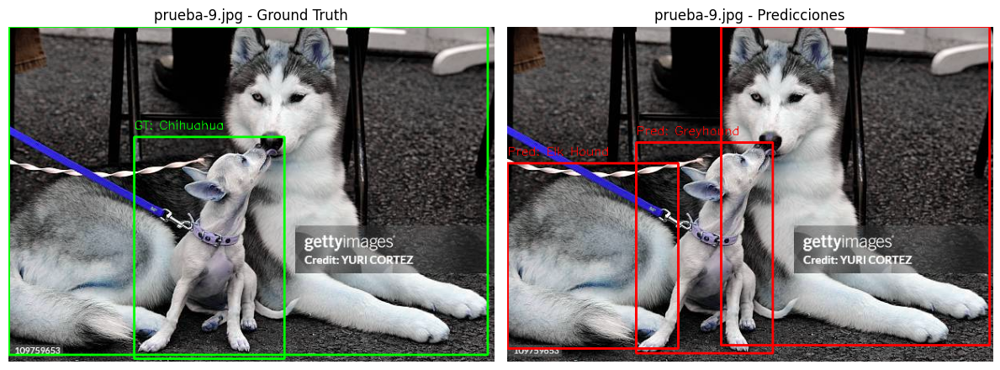

In [44]:
from matplotlib import pyplot as plt

# Lista para guardar predicciones por imagen
predicciones = []

# Visualización y recolección de resultados
for muestra in gt_data:
    nombre = muestra["nombre"]
    img_pil = Image.fromarray(muestra["imagen"])

    # Paso 1: Ejecutar mi función de detección y clasificación
    img_cv = cv2.cvtColor(np.array(img_pil), cv2.COLOR_RGB2BGR)
    results = yolo_model(img_cv)[0]
    perros_detectados = [box for box in results.boxes.data.cpu().numpy() if int(box[5]) == 16]

    boxes_pred = []
    labels_pred = []

    for box in perros_detectados:
        x1, y1, x2, y2 = map(int, box[:4])
        crop = img_pil.crop((x1, y1, x2, y2))

        # Clasificación con ResNet18
        tensor = transform(crop).unsqueeze(0).to(device)
        with torch.no_grad():
            salida = modelo_resnet18(tensor)
            pred_idx = salida.argmax(dim=1).item()

        boxes_pred.append([x1, y1, x2, y2])
        labels_pred.append(pred_idx)

    # Guardamos predicción para evaluación futura
    predicciones.append({
        "nombre": nombre,
        "boxes": boxes_pred,
        "labels": labels_pred
    })

    # Paso 2: Visualizar comparando GT vs Predicciones
    img_gt = muestra["imagen"].copy()
    img_pred = muestra["imagen"].copy()

    # Dibujar GT en verde
    for i, box in enumerate(muestra["boxes"]):
        x1, y1, x2, y2 = box
        label = class_names[muestra["labels"][i]]
        cv2.rectangle(img_gt, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img_gt, f"GT: {label}", (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    # Dibujar predicciones en azul
    for i, box in enumerate(boxes_pred):
        x1, y1, x2, y2 = box
        pred_label = razas[labels_pred[i]]
        cv2.rectangle(img_pred, (x1, y1), (x2, y2), (0, 0, 255), 2)
        cv2.putText(img_pred, f"Pred: {pred_label}", (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

    # Mostrar GT vs Predicción lado a lado
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].imshow(cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB))
    axs[0].set_title(f"{nombre} - Ground Truth")
    axs[0].axis("off")

    axs[1].imshow(cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB))
    axs[1].set_title(f"{nombre} - Predicciones")
    axs[1].axis("off")

    plt.tight_layout()
    plt.show()